# Network Representation of Hospital Likeness from Claims Data

The objective of the analysis is to identify the likeness among the hospitals through claims data. We are going to utilize to understand the likeness. 

In [6]:
import random
import itertools

from sklearn.metrics import jaccard_score
import networkx as nx
import numpy as np
import community

import matplotlib.pyplot as plt
import math

import networkx.algorithms.community as nx_comm
from community import community_louvain

from sklearn.metrics.cluster import normalized_mutual_info_score
import seaborn as sns

from collections import Counter

import pandas as pd
from scipy import stats


from IPython.display import Markdown, display

def pprint(string):
    display(Markdown(string))

**The data is publicly available here:**

https://data.cms.gov/provider-summary-by-type-of-service/medicare-inpatient-hospitals/medicare-inpatient-hospitals-by-provider-and-service/data

We start by loading the data into a Dataframe

In [2]:
raw_df = pd.read_csv('Medicare_Inpatient_Hospital_by_Provider_and_Service_2019.csv')

/Users/niloyc/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)



Select the columns that are relevant for the analysis


In [93]:
working_df = raw_df[['Rndrng_Prvdr_CCN', 'Rndrng_Prvdr_Org_Name', 'Rndrng_Prvdr_State_Abrvtn', 'DRG_Cd', 'Tot_Dschrgs', 'Avg_Submtd_Cvrd_Chrg', 'Avg_Tot_Pymt_Amt', 'Avg_Mdcr_Pymt_Amt']].copy()

In [91]:
working_df

,Rndrng_Prvdr_CCN,Rndrng_Prvdr_Org_Name,Rndrng_Prvdr_State_Abrvtn,DRG_Cd,Tot_Dschrgs,Avg_Submtd_Cvrd_Chrg,Avg_Tot_Pymt_Amt,Avg_Mdcr_Pymt_Amt
0,10033,University Of Alabama Hospital,AL,1,11,"$794,461.00","$214,021.00","$167,801.73"
1,30103,Mayo Clinic Hospital,AZ,1,13,"$666,829.46","$254,190.77","$229,727.15"
2,40007,Chi-St Vincent Infirmary,AR,1,15,"$848,500.60","$196,171.73","$163,372.13"
3,40114,Baptist Health Medical Center-Little Rock,AR,1,20,"$820,557.00","$174,058.35","$171,575.95"
4,50025,Uc San Diego Health Hillcrest - Hillcrest Med Ctr,CA,1,36,"$858,333.11","$277,904.19","$256,564.50"
...,...,...,...,...,...,...,...,...
188801,520138,Aurora St Lukes Medical Center,WI,988,22,"$70,156.64","$13,158.59","$11,338.95"
188802,520177,Froedtert Memorial Lutheran Hospital,WI,988,11,"$108,750.00","$23,695.64","$15,487.55"
188803,240010,Mayo Clinic Hospital Rochester,MN,989,11,"$33,567.64","$10,441.82","$7,674.82"
188804,330101,New York-Presbyterian Hospital,NY,989,13,"$41,517.15","$11,915.15","$10,099.85"


In [94]:
working_df.fillna(0, inplace = True)



**Creation of Nodes from the Provider Identifiers**

Creating the nodes of the network by extracting the unique provider identifiers.



In [9]:
nodes = working_df['Rndrng_Prvdr_CCN'].unique()
print(nodes)

[ 10033  30103  40007 ... 360358 230071 330406]


In [10]:
len(nodes)

3122



This is a national dataset. There are in total of 3122 hospitals in this dataset. 



**DRG Analysis for Link Creation**

We are going to use similarity among the DRG codes used to identify the similarity strength among the hospitals. This will help us to create the links in the network.



In [11]:
drg_counts_aggr = working_df.groupby(['Rndrng_Prvdr_CCN'])['DRG_Cd'].count().reset_index(name='counts')

In [12]:
drg_counts_aggr

,Rndrng_Prvdr_CCN,counts
0,10001,140
1,10005,59
2,10006,108
3,10007,15
4,10008,3
...,...,...
3117,670116,3
3118,670119,1
3119,670120,33
3120,670122,70




**Changing the field names for better readability**

Also changing the field types






In [14]:
working_df["Tot_Dschrgs"] = working_df["Tot_Dschrgs"].replace("[$,]", "", regex=True).astype(int)
working_df["Avg_Submtd_Cvrd_Chrg"] = working_df["Avg_Submtd_Cvrd_Chrg"].replace("[$,]", "", regex=True).astype(float)
working_df["Avg_Mdcr_Pymt_Amt"] = working_df["Avg_Mdcr_Pymt_Amt"].replace("[$,]", "", regex=True).astype(float)
working_df["Avg_Tot_Pymt_Amt"] = working_df["Avg_Tot_Pymt_Amt"].replace("[$,]", "", regex=True).astype(float)




Creating derived columns on total charges and total payment. Either of which can be used to determine the size of the node.



In [15]:
working_df['Total Charges'] = working_df['Tot_Dschrgs'] * working_df['Avg_Submtd_Cvrd_Chrg']
working_df['Total Payment'] = working_df['Tot_Dschrgs'] * working_df['Avg_Mdcr_Pymt_Amt']

In [17]:
working_df

,Rndrng_Prvdr_CCN,Rndrng_Prvdr_State_Abrvtn,DRG_Cd,Tot_Dschrgs,Avg_Submtd_Cvrd_Chrg,Avg_Tot_Pymt_Amt,Avg_Mdcr_Pymt_Amt,Total Charges,Total Payment
0,10033,AL,1,11,794461.00,214021.00,167801.73,8739071.00,1845819.03
1,30103,AZ,1,13,666829.46,254190.77,229727.15,8668782.98,2986452.95
2,40007,AR,1,15,848500.60,196171.73,163372.13,12727509.00,2450581.95
3,40114,AR,1,20,820557.00,174058.35,171575.95,16411140.00,3431519.00
4,50025,CA,1,36,858333.11,277904.19,256564.50,30899991.96,9236322.00
...,...,...,...,...,...,...,...,...,...
188801,520138,WI,988,22,70156.64,13158.59,11338.95,1543446.08,249456.90
188802,520177,WI,988,11,108750.00,23695.64,15487.55,1196250.00,170363.05
188803,240010,MN,989,11,33567.64,10441.82,7674.82,369244.04,84423.02
188804,330101,NY,989,13,41517.15,11915.15,10099.85,539722.95,131298.05



**Node Sizes Based On Total Charge Amount**

One of the logical ways to determine the node sizes is to base it on total Medicare charges


In [18]:
charge_amts_sum_aggr = working_df.groupby(['Rndrng_Prvdr_CCN'])['Total Charges'].sum().reset_index(name='Total Charges')

In [19]:
charge_amts_sum_aggr

,Rndrng_Prvdr_CCN,Total Charges
0,10001,3.021213e+08
1,10005,3.722419e+07
2,10006,1.761178e+08
3,10007,3.666216e+06
4,10008,7.421000e+05
...,...,...
3117,670116,5.936266e+06
3118,670119,3.583008e+06
3119,670120,6.304654e+07
3120,670122,1.537686e+08


In [20]:
# Create a dict for easy access

charge_dict = working_df.set_index('Rndrng_Prvdr_CCN').to_dict()['Total Charges']




**Network edges from similary between two hospitals**

We create edges between the nodes/providers based on their DRG similarity. To do that we need to create a list of DRGs for each provider/node in the network.





In [21]:
# create list of DRGs for each rendering provider

drg_dict = {}
for p in nodes:
    drg_dict[p] = working_df[working_df['Rndrng_Prvdr_CCN'] == p]['DRG_Cd'].tolist()




**Finding Jaccard Similarity** 

So we identify the Jaccard Similarity among each of the nodes/providers based on how many common DRGs they have among them compared to total number of DRGs among them.





In [22]:
# Find similarily among each nodes

def calculate_similarity(list1, list2):
    l1 = list(set(list1).intersection(list2))
    l2 = list(set(list1).union(list2))
    return len(l1)/len(l2)

edges = []

for i in range(len(nodes)-1):
    for j in range(i+1, len(nodes)):
        sim = calculate_similarity(drg_dict[nodes[i]], drg_dict[nodes[j]])
        edges.append((nodes[i], nodes[j], sim))
        
print(edges[:30])

[(10033, 30103, 0.5765124555160143), (10033, 40007, 0.4507042253521127), (10033, 40114, 0.5884353741496599), (10033, 50025, 0.5755395683453237), (10033, 50047, 0.375), (10033, 50100, 0.45229681978798586), (10033, 50108, 0.450354609929078), (10033, 50262, 0.48014440433212996), (10033, 50441, 0.6038961038961039), (10033, 50454, 0.6208053691275168), (10033, 50625, 0.6472222222222223), (10033, 60024, 0.6438356164383562), (10033, 70022, 0.6666666666666666), (10033, 70025, 0.6518771331058021), (10033, 90011, 0.6266666666666667), (10033, 100007, 0.5819070904645477), (10033, 100113, 0.6778523489932886), (10033, 100128, 0.6555183946488294), (10033, 100151, 0.5642857142857143), (10033, 110010, 0.6161971830985915), (10033, 110083, 0.5609756097560976), (10033, 140088, 0.6379928315412187), (10033, 140208, 0.5884353741496599), (10033, 140276, 0.6334519572953736), (10033, 140281, 0.6710963455149501), (10033, 150084, 0.6075085324232082), (10033, 170040, 0.6915584415584416), (10033, 180040, 0.422535211


In this method, there will be an similarity score between any two node/provider. We need to discard some of the links otherwise, it becomes a clique. But before we discard, let us see how many nodes and edges are there.




In [75]:
print(len(nodes))
print(len(edges))

3122
4871881



**Create the graph**

Let us now create the graph now that we have the nodes and some basis for creating the edges. But since 487K edges is too much and it does not make sense to represent all the weak links among the providers, we only show the strongest of links (with similarity score of 0.75 or higher)




In [23]:
# Create the graph

G = nx.Graph()
G.add_nodes_from(nodes)
for n1, n2, sim in edges:
    if not n1 == n2:
        if sim >=0.75 :    
            G.add_edges_from([(n1, n2)])

G.remove_edges_from(nx.selfloop_edges(G))
            

In [24]:
len(G.edges)

1140

In [96]:
len(G.nodes)

3122


**Drawing the Network**

Creating the graph is the next step. Let us see how this looks like




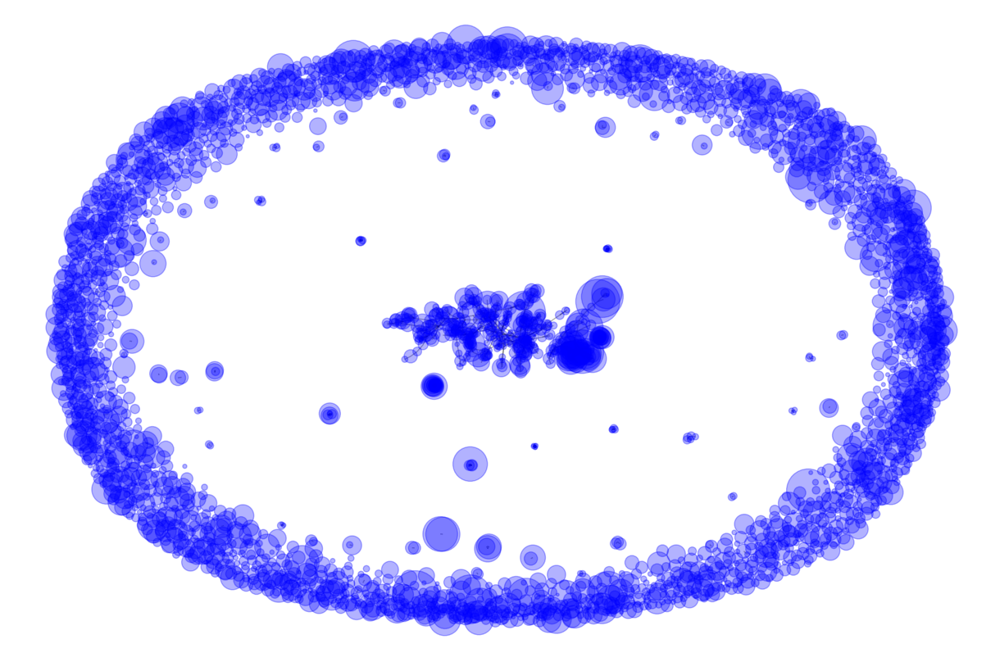

In [159]:
plt.figure(1, figsize = (12,8), dpi = 100)
sizes = list(np.asarray(list(charge_dict.values()))/10000)
nx.draw(G, with_labels = False, node_size = sizes, node_color = 'b', edge_color = 'black', alpha = 0.3)


Oh-oh. It does not look very good. May be changing the layout would be useful. Let's create a random layout.



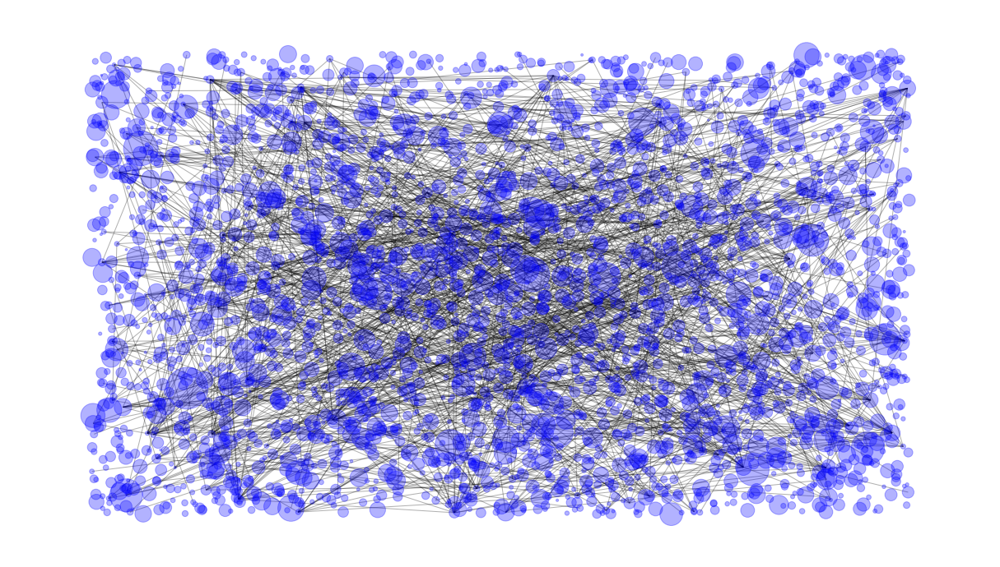

In [163]:
plt.figure(1, figsize = (16,9), dpi = 75)
sizes = list(np.asarray(list(charge_dict.values()))/10000)
nx.draw_random(G, with_labels = False, node_size = sizes, node_color = 'b', edge_color = 'black', alpha = 0.3)


Hmm.

Clearly it is too much. One can see the challenge of network analysis immediately. The data is very difficult to visualize in 2D without specialized network visualization tools.


Just for fun, let us try to draw the nodes alone.


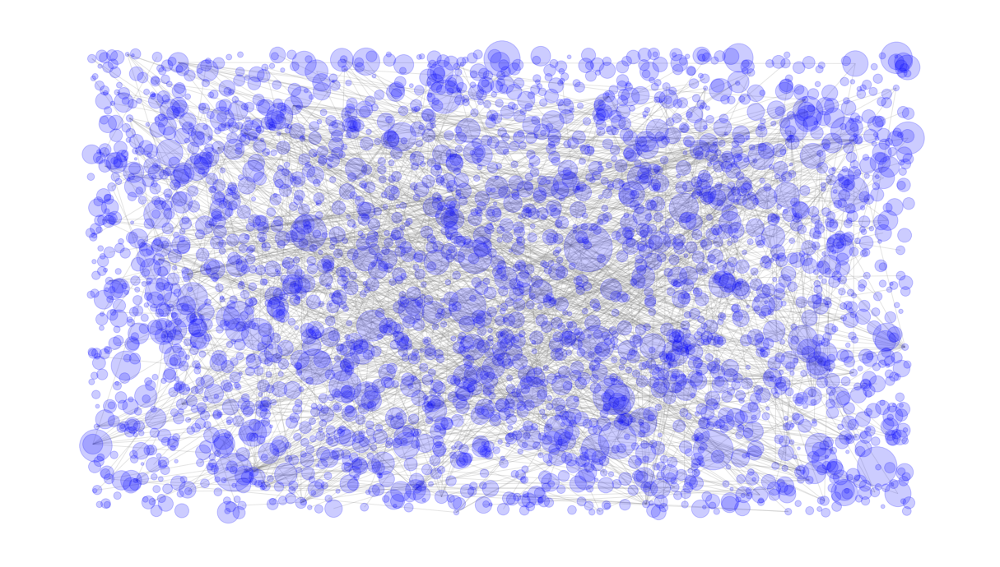

In [164]:
d = dict(nx.degree(G))
plt.figure(1, figsize = (16,9), dpi = 75)
sizes = list(np.asarray(list(charge_dict.values()))/7500)
nx.draw_random(G, node_size=sizes, alpha = 0.2, node_color = 'b', with_labels = False, edge_color = 'gray', node_shape = 'o')


There you have it. The masterpiece similar to that of the great Jackson Pollock



Let us turn our attention to make the analysis more visually intuitive and useful. We clearly need to filter a set of logical nodes. For that, I decided to filter by State. Even then, I selected California which has one of the highest number of hospitals in the country. Here we go for a similar analysis for the hospitals in the State of CA.




## State Specific Analysis ##

In [56]:
state = 'CA'

In [109]:
working_df_st = working_df[working_df['Rndrng_Prvdr_State_Abrvtn'] == state].copy()

In [110]:
working_df_st

,Rndrng_Prvdr_CCN,Rndrng_Prvdr_Org_Name,Rndrng_Prvdr_State_Abrvtn,DRG_Cd,Tot_Dschrgs,Avg_Submtd_Cvrd_Chrg,Avg_Tot_Pymt_Amt,Avg_Mdcr_Pymt_Amt
4,50025,Uc San Diego Health Hillcrest - Hillcrest Med Ctr,CA,1,36,"$858,333.11","$277,904.19","$256,564.50"
5,50047,California Pacific Medical Center- Van Ness Ca...,CA,1,20,"$1,133,069.10","$321,071.65","$297,452.60"
6,50100,Sharp Memorial Hospital,CA,1,15,"$1,529,342.27","$332,130.73","$200,875.60"
7,50108,"Sutter Medical Center, Sacramento",CA,1,28,"$801,909.36","$281,291.57","$251,833.57"
8,50262,Ronald Reagan U C L A Medical Center,CA,1,11,"$1,503,639.36","$514,087.64","$472,071.09"
...,...,...,...,...,...,...,...,...
188499,50084,St Joseph's Medical Center Of Stockton,CA,987,11,"$219,198.73","$30,909.18","$30,133.18"
188500,50100,Sharp Memorial Hospital,CA,987,15,"$186,516.80","$29,489.33","$25,880.27"
188501,50262,Ronald Reagan U C L A Medical Center,CA,987,12,"$383,549.67","$119,546.50","$100,469.67"
188502,50625,Cedars-Sinai Medical Center,CA,987,26,"$522,179.27","$51,821.58","$45,986.69"




We create a simple dataframe of provider id and name. This will be useful later



In [111]:
hospitals = working_df_st[['Rndrng_Prvdr_CCN', 'Rndrng_Prvdr_Org_Name']].copy()
hospitals.drop_duplicates( inplace = True)
len(hospitals)

288

In [112]:
nodes_st = working_df_st['Rndrng_Prvdr_CCN'].unique()
drg_st = working_df_st['DRG_Cd'].unique()

In [100]:
len(nodes_st)

288

In [60]:
len(drg_st)

415



**Changing the basis for link among two nodes**

A Jaccard Similarity seems a too blunt a method to establish similarity among two nodes. Creating a better mechanism by compariing the charges across all DRGs and thieir closeleness. 



In [61]:
# create a dict with a list of DRG specific payments for each CCN/Node. Every DRG to be present in the list,
# if there is no payment for a spcific DRG, the value would be zero. A dict entry would look like:
# 50084: [0, 0, 934983, 393404, 943409, ....0, 0]

#print(drg_st)

drg_dict = {}

for n in nodes_st:
    #print(n)
    
    # create an list that will hold the total charges for all DRGs for each hospital. Initialize to zero.
    tmp_lst = list(np.zeros(drg_st.shape[0]))
    
    # create a temp df to that has data only for the provider being considered in the loop
    tmp_df = working_df_st.loc[working_df_st['Rndrng_Prvdr_CCN'] == n]

    # create a df with the total charges grouped by DRG code for that provider. Only the DRGs present for the provider will appear
    tmp_charges = tmp_df.groupby(['DRG_Cd'])['Total Charges'].sum().reset_index(name='Total Charges') 

    # populate the list that will hold the DRG specific total charges from the dataframe
    for index, row in tmp_charges.iterrows():
        tmp_lst[np.where(drg_st == row['DRG_Cd'])[0][0]] = row['Total Charges']

    # populate a dictionary that will return the DRG total charges list for every provider/node    
    drg_dict[n] = tmp_lst
    
    
#print(drg_dict)


Now that we have each and every DRG charges, including zero charges, for each provider, we can imagine each DRG as an independent dimension and get the distance among the nodes in that DRG dimension space.




In [62]:
def eucld_dist(arr1, arr2):
    diff = arr1 - arr2
    sum_sq = np.dot(diff.T, diff)
    return np.sqrt(sum_sq)/(np.average(arr1) + np.average(arr2))

In [63]:
edges_st = []
dist_lst = []

for i in range(len(nodes_st)-1):
    for j in range(i+1, len(nodes_st)):
        
        
        # Calculate the distance between two providers/nodes based on Eucleadean distance of their DRG charges
        #sim = calculate_similarity(drg_dict[nodes_st[i]], drg_dict[nodes_st[j]])
        dist = eucld_dist(np.asarray(drg_dict[nodes_st[i]]), np.asarray(drg_dict[nodes_st[j]]))
        
        # Keep a tab of the distances in order to find out distance stats to exclude and include certain edges
        dist_lst.append(dist)
        
        edges_st.append((nodes_st[i], nodes_st[j], dist))

        

In [65]:
print(edges_st[:10])

[(50025, 50047, 22.159587960730246), (50025, 50100, 18.405642370322724), (50025, 50108, 19.411168449653974), (50025, 50262, 18.596632992648882), (50025, 50441, 31.857365596152164), (50025, 50454, 25.185073849762716), (50025, 50625, 36.8661119671391), (50025, 50057, 26.858498374841254), (50025, 50060, 19.943230859054797), (50025, 50115, 26.336619504666068)]



**Distance Descriptive Statistics**

Since we do not have any idea about how actual value of those distances, let us run some descriptive statistics on the distances we have seen


In [79]:
print('Mean = ' + str(np.mean(np.asarray(dist_lst))))
print('Std Dev = ' + str(np.std(np.asarray(dist_lst))))
print('Max = ' + str(np.max(np.asarray(dist_lst))))
print('Min = ' + str(np.min(np.asarray(dist_lst))))
print('1 Percentile = ' + str(np.percentile(np.asarray(dist_lst), 1)))
print('2 Percentile = ' + str(np.percentile(np.asarray(dist_lst), 2)))
print('5 Percentile = ' + str(np.percentile(np.asarray(dist_lst), 5)))
print('10 Percentile = ' + str(np.percentile(np.asarray(dist_lst), 10)))
print('25 Percentile = ' + str(np.percentile(np.asarray(dist_lst), 25)))
print('50 Percentile = ' + str(np.percentile(np.asarray(dist_lst), 50)))
print('75 Percentile = ' + str(np.percentile(np.asarray(dist_lst), 75)))

Mean = 69.78327626764887
Std Dev = 38.42512152759415
Max = 325.87970242279636
Min = 9.399692869175981
1 Percentile = 18.87821625283229
2 Percentile = 21.106090310914617
5 Percentile = 25.903045048180857
10 Percentile = 31.359418828426726
25 Percentile = 44.242062508618986
50 Percentile = 61.66382546080571
75 Percentile = 85.5610824412783



**Creating the Graph**

Let us create the graph now and see how this looks. Let's show a link only if the nodes are realy close, i.e. distance between them is in the lowest 1%



In [113]:
G_st = nx.Graph()
G_st.add_nodes_from(nodes_st)
for n1, n2, dist in edges_st:
    if not n1 == n2:
        if dist <= 19 :    
            G_st.add_edges_from([(n1, n2)], weight = dist)

print(len(G_st.nodes))
print(len(G_st.edges))

288
437


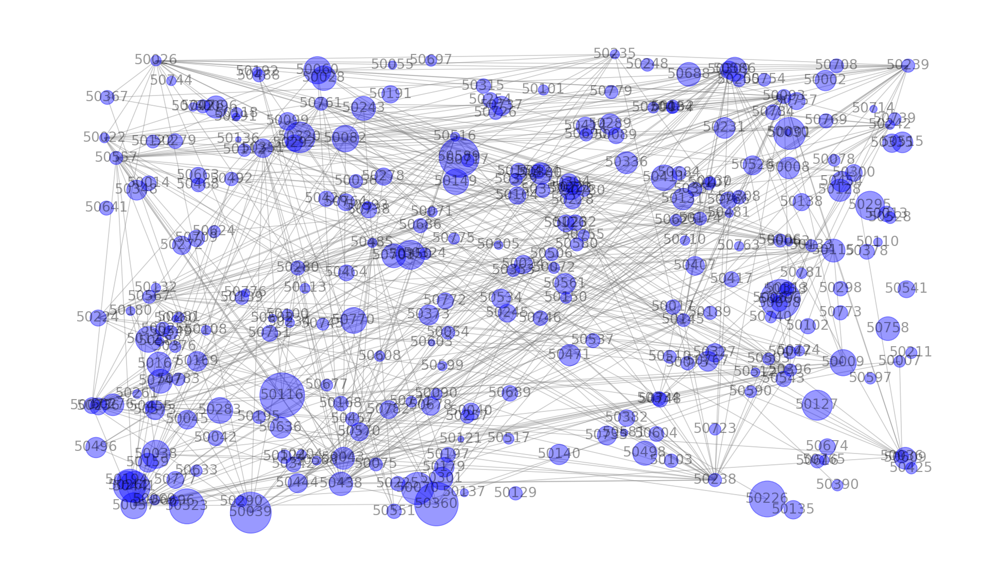

In [168]:
plt.figure(1, figsize = (16,9), dpi = 120)
sizes = list(np.asarray(list(charge_dict.values()))/5000)
nx.draw_random(G_st, with_labels = True, node_size = sizes, node_color = 'b', edge_color = 'gray', alpha = 0.4, font_size = 12, font_color = 'black')
plt.savefig('fig-CA', dpi = 600, format='png')

# 
Now we are getting somewhere. If we blow up the image, it shows the nodes clearly and we know which node is connected to which node. We still do not see hospital names. Let us fix that.



In [170]:
hosp_dict = dict(zip(list(hospitals['Rndrng_Prvdr_CCN']), list(hospitals['Rndrng_Prvdr_Org_Name'])))

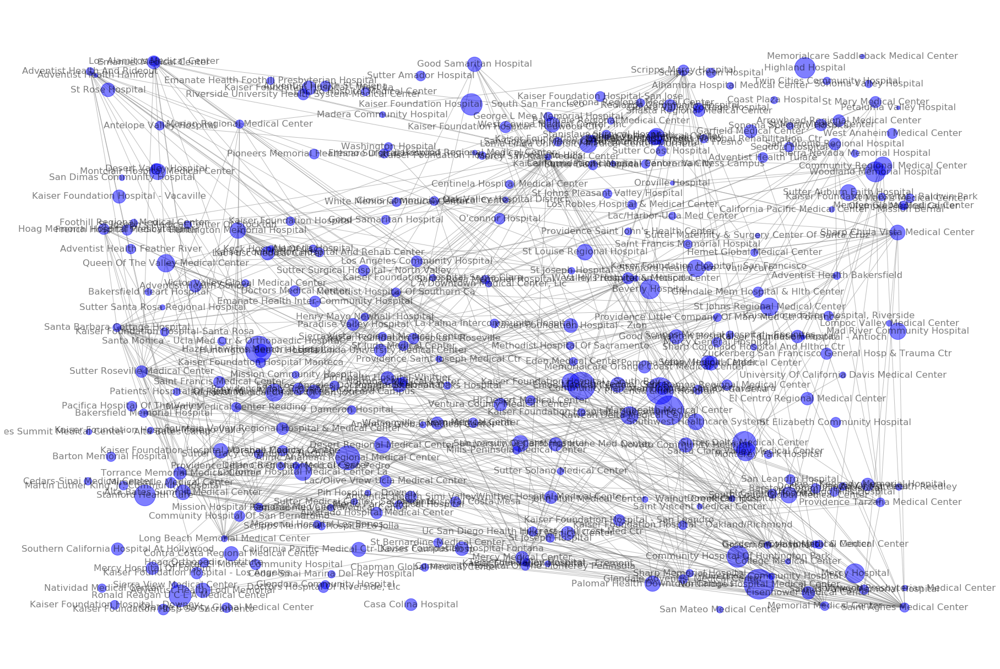

In [171]:
plt.figure(1, figsize = (24,16), dpi = 75)
sizes = list(np.asarray(list(charge_dict.values()))/5000) 
nx.draw_random(G_st, with_labels = True, node_size = sizes, labels = hosp_dict, node_color = 'b', edge_color = 'gray', alpha = 0.5, font_size = 16, font_color = 'black')
plt.savefig('fig-CA2', dpi = 600, format='png')

This also doesn't look very good. If we are trying to find out hospitals that have high degree of similarity, then perhaps we can label the nodes with only high degrees.

Text(0.5, 1.0, 'Degree Distribution of CA Hospitals on DRG association')

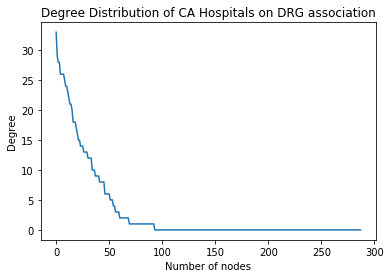

In [145]:
degree_sequence = sorted((d for n, d in G_st.degree()), reverse=True)
plt.plot(degree_sequence)
plt.xlabel('Number of nodes')
plt.ylabel('Degree')
plt.title('Degree Distribution of CA Hospitals on DRG association')

As we can see, if we set a threshold of degree 10, we would likely get manageable number of nodes where we can print the names.

In [173]:
high_deg_nodes = [node for node,degree in dict(G_st.degree()).items() if degree > 10]
print(len(high_deg_nodes))

34


So we only keep those 34 hospital names and supress rest of the names in our hospital name list

In [174]:
for k, v in hosp_dict.items():
    if k not in high_deg_nodes:
        hosp_dict[k] = ''

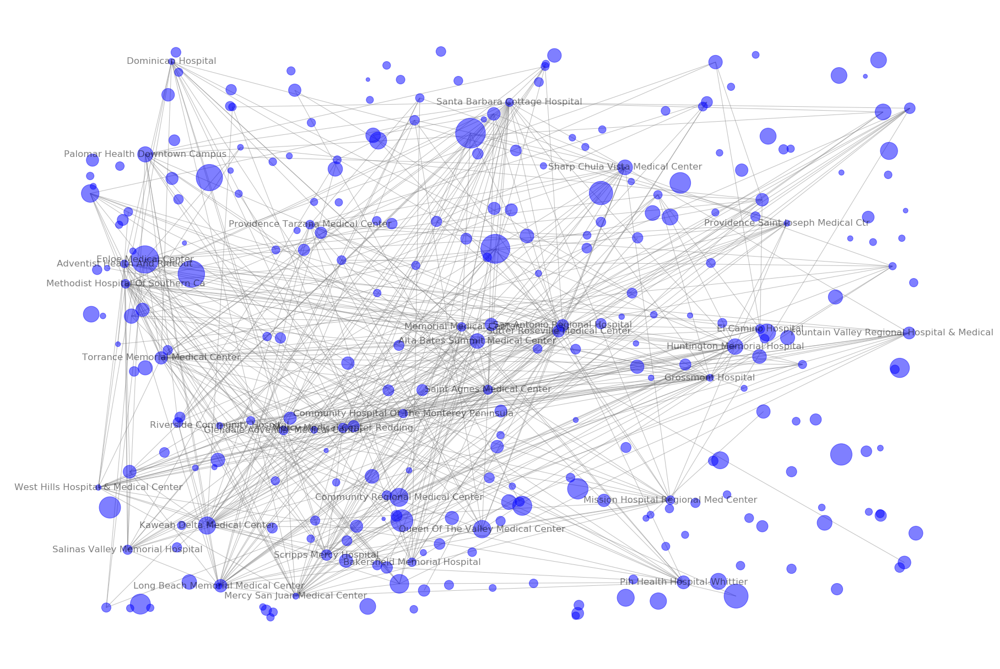

In [177]:

plt.figure(1, figsize = (24,16), dpi = 75)
sizes = list(np.asarray(list(charge_dict.values()))/5000) 
nx.draw_random(G_st, with_labels = True, node_size = sizes, labels = hosp_dict, node_color = 'b', edge_color = 'gray', alpha = 0.5, font_size = 16, font_color = 'black')
plt.savefig('fig-CA3', dpi = 600, format='png')